In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
! pip install kaggle

In [3]:
import os
checkpoint_dir = "/content/drive/MyDrive/Monet"
os.makedirs(checkpoint_dir, exist_ok=True)
print("Checkpoint directory:", checkpoint_dir)


Checkpoint directory: /content/drive/MyDrive/Monet


In [4]:
!mkdir -p ~/.kaggle

In [5]:
!cp /content/drive/MyDrive/ColabNotebooks/kaggle_API_credentials/kaggle.json ~/.kaggle/kaggle.json

In [6]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list


In [7]:
! kaggle competitions download -c gan-getting-started

 98% 359M/367M [00:04<00:00, 71.9MB/s]
100% 367M/367M [00:04<00:00, 80.3MB/s]


In [8]:
! unzip gan-getting-started

Streaming output truncated to the last 5000 lines.
  inflating: photo_jpg/46e84039a1.jpg  
  inflating: photo_jpg/46f391abec.jpg  
  inflating: photo_jpg/46f5ef1042.jpg  
  inflating: photo_jpg/4706619607.jpg  
  inflating: photo_jpg/4707b03a08.jpg  
  inflating: photo_jpg/47100a9939.jpg  
  inflating: photo_jpg/471f4755b9.jpg  
  inflating: photo_jpg/472b351bc4.jpg  
  inflating: photo_jpg/472d5ac100.jpg  
  inflating: photo_jpg/4758e5dd4c.jpg  
  inflating: photo_jpg/4762bb79ef.jpg  
  inflating: photo_jpg/4778b13518.jpg  
  inflating: photo_jpg/4787b82d37.jpg  
  inflating: photo_jpg/478e07feaa.jpg  
  inflating: photo_jpg/478eb12a82.jpg  
  inflating: photo_jpg/479698b371.jpg  
  inflating: photo_jpg/4796d67f61.jpg  
  inflating: photo_jpg/47aad493bd.jpg  
  inflating: photo_jpg/47ae0edd23.jpg  
  inflating: photo_jpg/47b94957ff.jpg  
  inflating: photo_jpg/47bb43fe3e.jpg  
  inflating: photo_jpg/47bb59d449.jpg  
  inflating: photo_jpg/47d391d94b.jpg  
  inflating: photo_jpg/47df26

In [8]:
! pip install wandb weave

In [9]:
! pip install torch-fidelity


In [10]:
! wandb login

wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Find your API key here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter: 
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: llodi22 (llodi22-free-university-of-tbilisi-) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [11]:
!unzip -qq gan-getting-started.zip -d gan_data

In [12]:
import os
from glob import glob

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

from PIL import Image
import matplotlib.pyplot as plt
import wandb


# ============================================================
# 1. W&B INIT
# ============================================================
wandb.init(
    project="Monet_Paintings_Lodia",
    config={
        "image_size": 256,
        "batch_size": 1,         # CycleGAN paper also uses batch size = 1
        "lr": 0.0002,
        "beta1": 0.5,
        "beta2": 0.999,
        "lambda_cyc": 10.0,      # weight for cycle-consistency loss
        "lambda_idt": 5.0,       # weight for identity loss (= 0.5 * lambda_cyc)
        "epochs": 16,
        "model": "CycleGAN_Hinge_ResNet"
    }
)
config = wandb.config

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on:", device)

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: Currently logged in as: llodi22 (llodi22-free-university-of-tbilisi-) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Running on: cuda


In [13]:
class MonetPhotoDataset(Dataset):
    """
    Unpaired dataset:
    - domain A: photos (photo_jpg)
    - domain B: Monet paintings (monet_jpg)

    We don't have aligned pairs, so for each index we pick:
    - one photo from A (cyclic over list)
    - one Monet from B (cyclic over list)
    """

    def __init__(self, root_photo, root_monet, transform=None):
        self.photo_files = sorted(glob(os.path.join(root_photo, "*.jpg")))
        self.monet_files = sorted(glob(os.path.join(root_monet, "*.jpg")))
        self.transform = transform

        self.len_A = len(self.photo_files)
        self.len_B = len(self.monet_files)
        self.length = max(self.len_A, self.len_B)

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        # cycle through if lengths differ
        photo_path = self.photo_files[idx % self.len_A]
        monet_path = self.monet_files[idx % self.len_B]

        photo = Image.open(photo_path).convert("RGB")
        monet = Image.open(monet_path).convert("RGB")

        if self.transform:
            photo = self.transform(photo)
            monet = self.transform(monet)

        # return (A, B) where:
        # A = real photo, B = real Monet
        return photo, monet


# transforms: resize + flip + tensor + normalize to [-1, 1]
transform = transforms.Compose([
    transforms.Resize((config.image_size, config.image_size)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])

data_root = "/content/gan_data"
dataset = MonetPhotoDataset(
    root_photo=os.path.join(data_root, "photo_jpg"),
    root_monet=os.path.join(data_root, "monet_jpg"),
    transform=transform
)

dataloader = DataLoader(dataset, batch_size=config.batch_size, shuffle=True)
print("Dataset size:", len(dataset))


Dataset size: 7038


In [14]:
class ResNetBlock(nn.Module):
    def __init__(self, dim):
        super(ResNetBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim),
            nn.ReLU(True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim)
        )

    def forward(self, x):
        return x + self.conv_block(x)

In [15]:
class ResNetGenerator(nn.Module):
    def __init__(self, input_nc=3, output_nc=3, ngf=32, n_blocks=9, n_downsampling=2):
        """
        ngf: Number of generator filters (default 32 for speed, standard is 64)
        n_blocks: 6 for speed/128x128, 9 for quality/256x256
        """
        super(ResNetGenerator, self).__init__()

        # Initial convolution
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0),
            nn.InstanceNorm2d(ngf),
            nn.ReLU(True)
        ]

        # Downsampling
        in_features = ngf
        out_features = in_features * 2
        for _ in range(n_downsampling):
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features
            out_features = in_features * 2

        # Residual blocks
        for _ in range(n_blocks):
            model += [ResNetBlock(in_features)]

        # Upsampling
        out_features = in_features // 2
        for _ in range(n_downsampling):
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features
            out_features = in_features // 2

        # Output layer
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0),
            nn.Tanh()
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

In [16]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_nc=3, ndf=32, n_layers=3):
        """
        ndf: Number of discriminator filters (default 32 for speed, standard is 64)
        """
        super(PatchDiscriminator, self).__init__()

        # 70x70 PatchGAN
        kw = 4
        padw = 1
        sequence = [
            nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw),
            nn.LeakyReLU(0.2, True)
        ]

        nf_mult = 1
        nf_mult_prev = 1
        for n in range(1, n_layers):
            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n, 8)
            sequence += [
                nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=2, padding=padw, bias=False),
                nn.InstanceNorm2d(ndf * nf_mult),
                nn.LeakyReLU(0.2, True)
            ]

        nf_mult_prev = nf_mult
        nf_mult = min(2 ** n_layers, 8)

        sequence += [
            nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=1, padding=padw, bias=False),
            nn.InstanceNorm2d(ndf * nf_mult),
            nn.LeakyReLU(0.2, True)
        ]

        sequence += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=kw, stride=1, padding=padw)]

        self.model = nn.Sequential(*sequence)

    def forward(self, x):
        return self.model(x)

In [17]:
# Generators:
# G_P2M: Photo -> Monet
# G_M2P: Monet -> Photo
G_P2M = ResNetGenerator().to(device)
G_M2P = ResNetGenerator().to(device)

# Discriminators:
# D_P: distinguishes real Photo from fake Photo
# D_M: distinguishes real Monet from fake Monet
D_P = PatchDiscriminator().to(device)
D_M = PatchDiscriminator().to(device)

In [18]:
# Initialize weights (small normal, as in many GAN examples)
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif isinstance(m, (nn.InstanceNorm2d, nn.BatchNorm2d)):
        if m.weight is not None:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
        if m.bias is not None:
            nn.init.constant_(m.bias.data, 0)


In [19]:
G_P2M.apply(init_weights)
G_M2P.apply(init_weights)
D_P.apply(init_weights)
D_M.apply(init_weights)

PatchDiscriminator(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (9): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

In [20]:
# Loss functions
def d_hinge_loss(real_logits, fake_logits):
    loss_real = torch.mean(torch.relu(1.0 - real_logits))
    loss_fake = torch.mean(torch.relu(1.0 + fake_logits))
    return loss_real + loss_fake

def g_hinge_loss(fake_logits):
    return -torch.mean(fake_logits)  #Hinge

criterion_cycle = nn.L1Loss()
criterion_identity = nn.L1Loss()


In [21]:
# Optimizers: one for both generators, one each for discriminators
optimizer_G = optim.Adam(
    list(G_P2M.parameters()) + list(G_M2P.parameters()),
    lr=config.lr, betas=(config.beta1, config.beta2)
)

optimizer_D_P = optim.Adam(D_P.parameters(), lr=config.lr,
                           betas=(config.beta1, config.beta2))
optimizer_D_M = optim.Adam(D_M.parameters(), lr=config.lr,
                           betas=(config.beta1, config.beta2))


In [22]:
resume_path = f"{checkpoint_dir}/exp2_checkpoint_8.pth"

start_epoch = 1
if resume_path:
    print("Loading checkpoint:", resume_path)
    ckpt = torch.load(resume_path, map_location=device)

    G_P2M.load_state_dict(ckpt["G_P2M"])
    G_M2P.load_state_dict(ckpt["G_M2P"])
    D_P.load_state_dict(ckpt["D_P"])
    D_M.load_state_dict(ckpt["D_M"])

    optimizer_G.load_state_dict(ckpt["opt_G"])
    optimizer_D_P.load_state_dict(ckpt["opt_D_P"])
    optimizer_D_M.load_state_dict(ckpt["opt_D_M"])

    start_epoch = ckpt["epoch"] + 1
    print("Resuming from epoch:", start_epoch)

Loading checkpoint: /content/drive/MyDrive/Monet/exp2_checkpoint_8.pth
Resuming from epoch: 9


In [23]:
# helper to denormalize images for visualization
def denorm(t):
    # from [-1, 1] -> [0, 1]
    return (t * 0.5 + 0.5).clamp(0, 1)

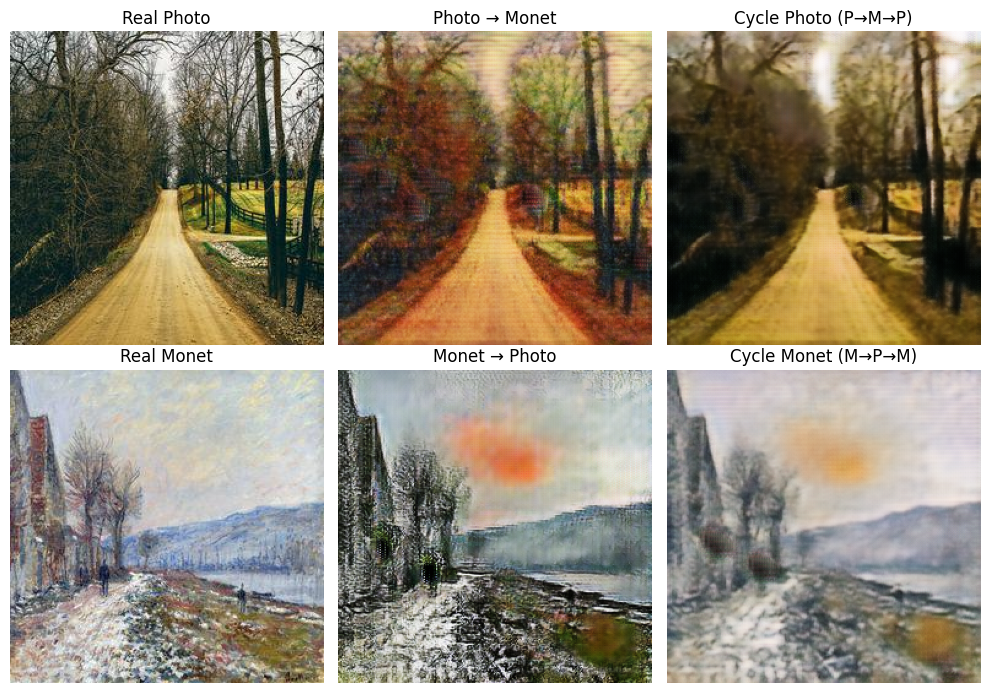

Epoch [9/16] G_total: 3.1499 D_P: 2.5263 D_M: 1.3626
Saved checkpoint: /content/drive/MyDrive/Monet/exp2_checkpoint_9.pth


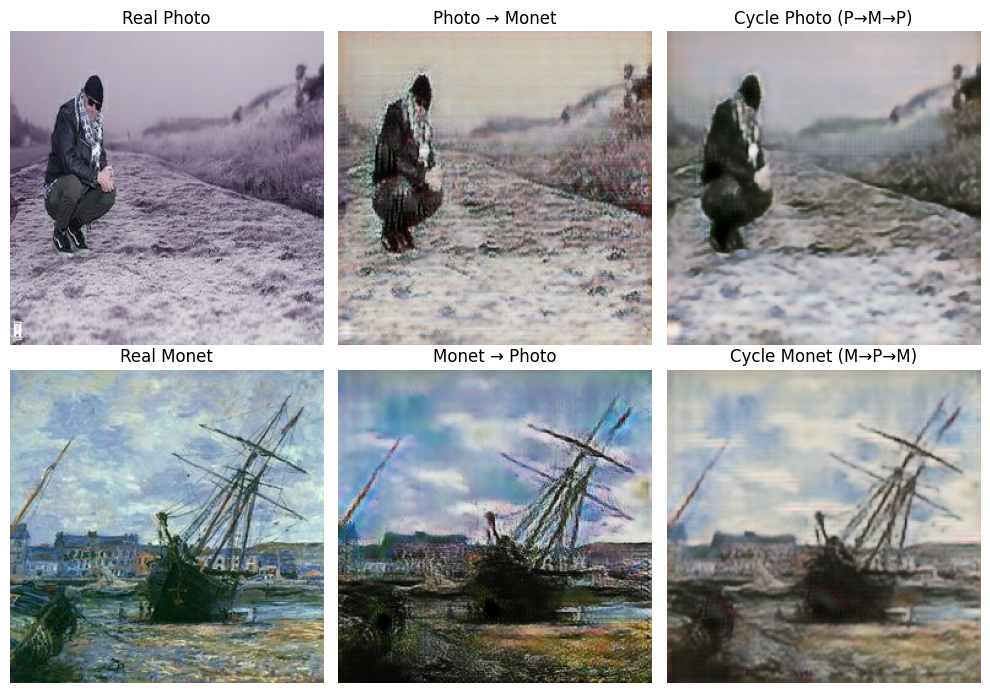

Epoch [10/16] G_total: 6.5661 D_P: 0.5636 D_M: 0.3912
Saved checkpoint: /content/drive/MyDrive/Monet/exp2_checkpoint_10.pth


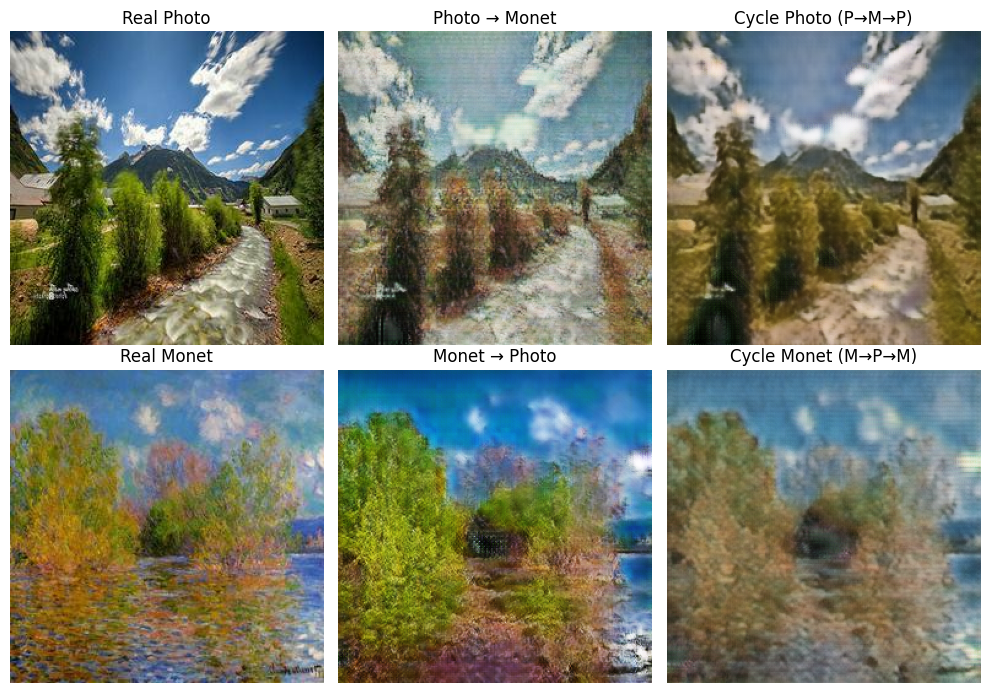

Epoch [11/16] G_total: 5.8238 D_P: 1.3969 D_M: 0.7692
Saved checkpoint: /content/drive/MyDrive/Monet/exp2_checkpoint_11.pth


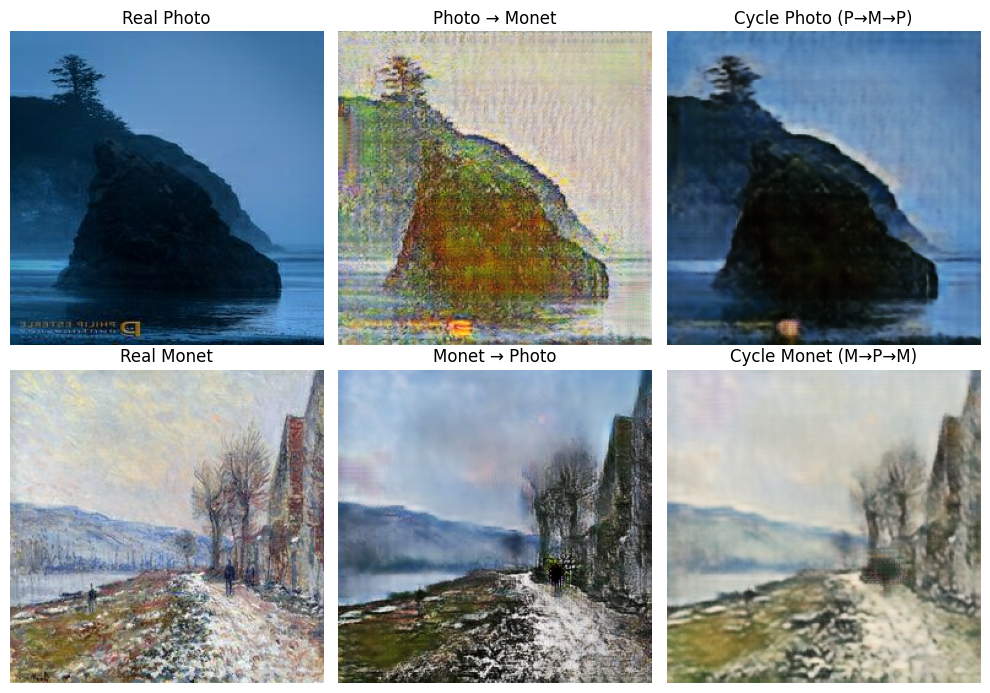

Epoch [12/16] G_total: 5.5396 D_P: 1.2181 D_M: 0.3061
Saved checkpoint: /content/drive/MyDrive/Monet/exp2_checkpoint_12.pth


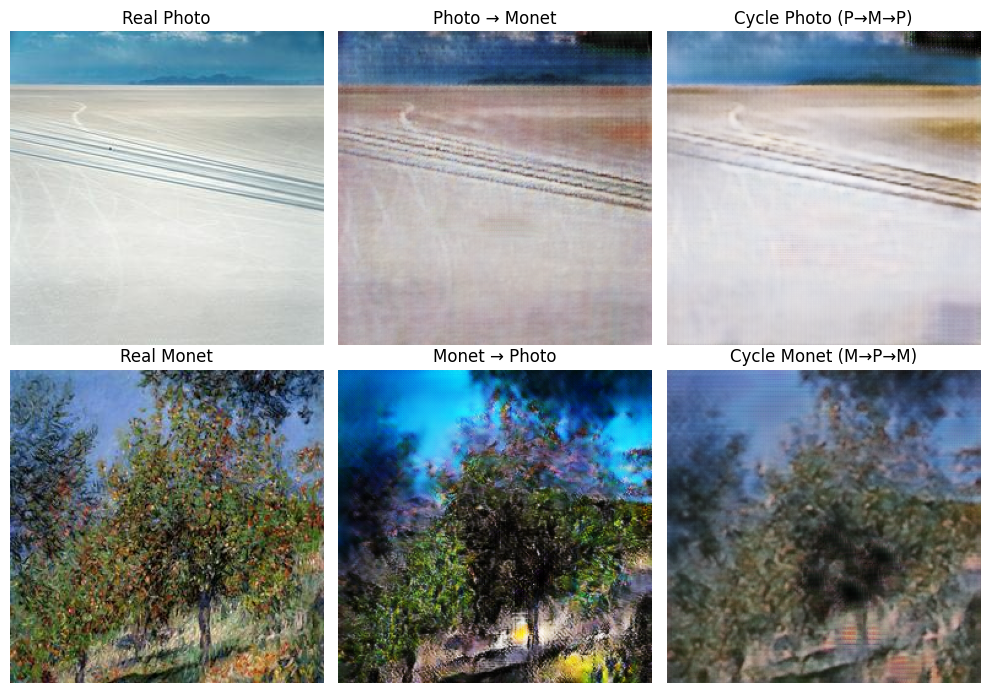

Epoch [13/16] G_total: 5.2554 D_P: 0.9175 D_M: 0.7619
Saved checkpoint: /content/drive/MyDrive/Monet/exp2_checkpoint_13.pth


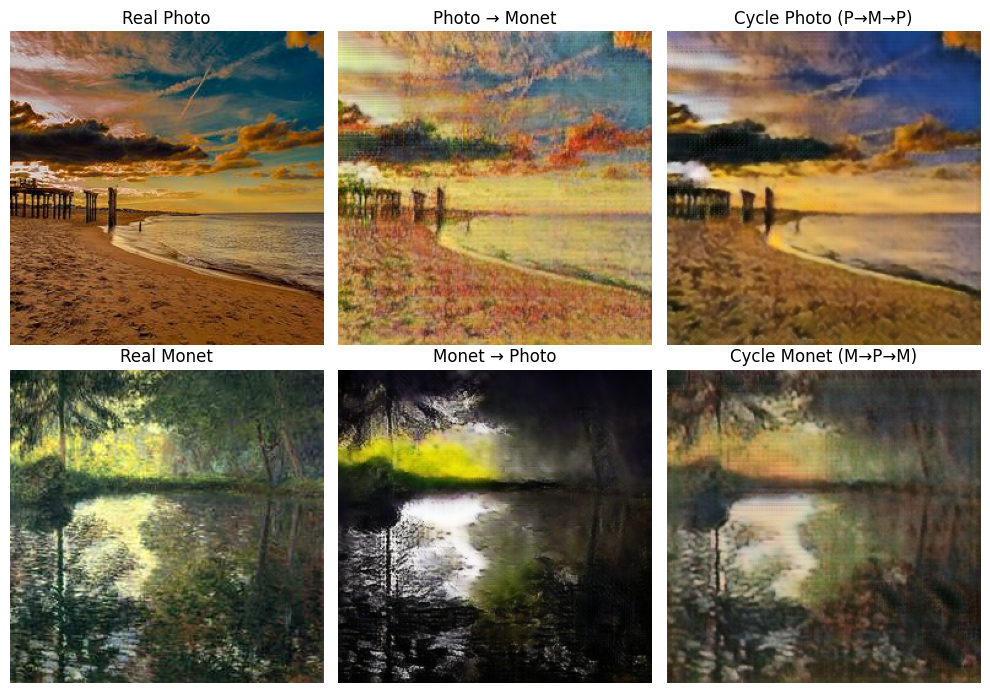

Epoch [14/16] G_total: 7.2107 D_P: 1.6106 D_M: 0.0780
Saved checkpoint: /content/drive/MyDrive/Monet/exp2_checkpoint_14.pth


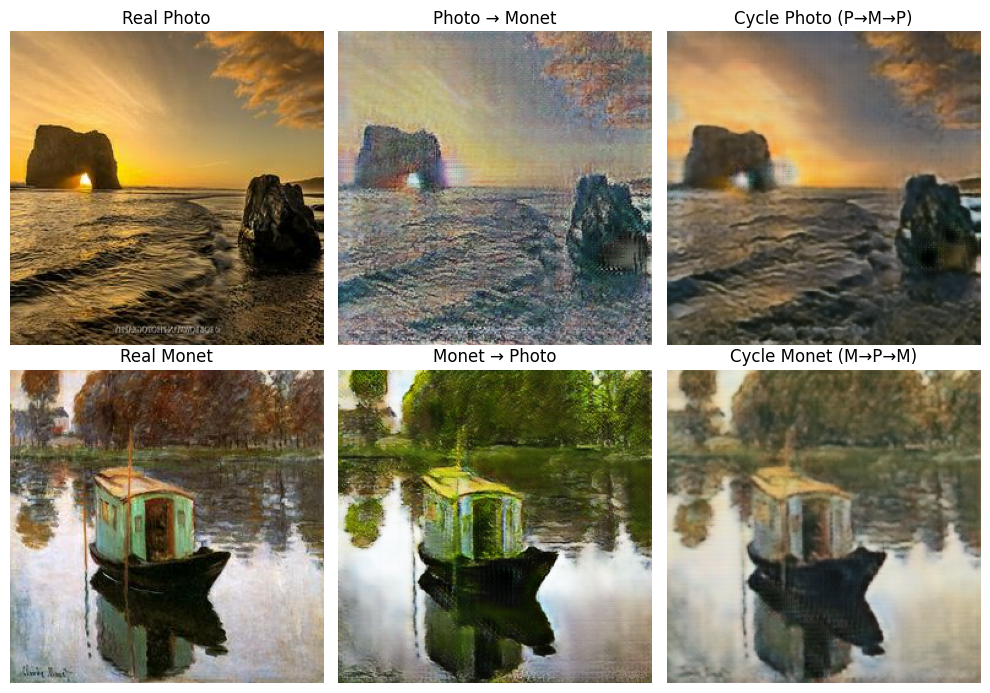

Epoch [15/16] G_total: 7.0518 D_P: 2.2486 D_M: 0.3178
Saved checkpoint: /content/drive/MyDrive/Monet/exp2_checkpoint_15.pth


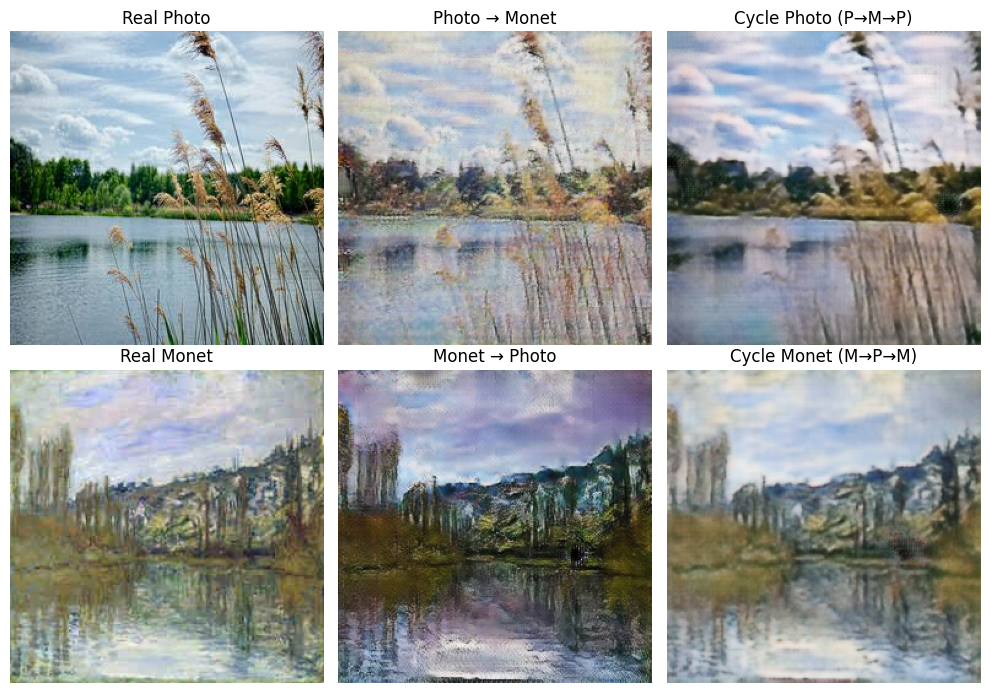

Epoch [16/16] G_total: 6.2433 D_P: 0.9551 D_M: 0.2015
Saved checkpoint: /content/drive/MyDrive/Monet/exp2_checkpoint_16.pth


D_M,▁▁▃▃▁▂█▂▁▂▄▂▂▂▁▄▁▂▂▂▂▁▂▂▁▄▂▁▆▂▁▁▁▁▁▃▁▁▁▁
D_P,▃▂▂▁▂▃▃▁▅▁▂▃▁▃▁▂▃▁▃▄▁▃▄▂▄▄▂▄▃▃█▃▃▄▄█▂▁▃▂
G_M2P_adv,▂▇█▇▅▃▅▆▆▄▅▅▃▆▆▃▇▃▄▁▆▄▃▆▃▂▁▆▅▅▅▄▄▅▄▆▁▃▄▆
G_P2M_adv,▆▂▆▄▄▂▅▃▄▃▃▄▃▃▅▇▅▁▃▅▃▂▄▄▄▄▅▄█▁▃▄▂▄█▅▆▂▁▄
G_total,▅█▆▅▄▇▄▁▅▅▄▅▄▆▅▄▇▆▄▇▅▅▃▇▆▃▄▇▅▅▆▅▄▃▅▂▄▅▅▄
cycle_loss,█▅▂▃▁▂▃▃▁▂▁▂▂▂▂▁▃▂▃▂▃▂▂▅▂▄▄▂▃▂▁▆▁▁▂▂▁▁▂▁
idt_M,▄▄▅▃▃▄▂█▂▄▃▃▄▆▂▆▇▂▃▁▃▅▃▃▅▃▅▁▄▂▃▁▁▃▄▃▁▂▁▃
idt_P,▃▂▃▄▆▁▅▂▂▄▇▃▂▂▄▃▄▂▃▄▂▃▃▂▂▁▂▁▁▅▂▂▂█▄▂▂▃▂▁
D_M,0.20152
D_P,0.95512
G_M2P_adv,0.93634


In [24]:
epochs = config.epochs

for epoch in range(start_epoch, epochs + 1):
    for i, (real_P, real_M) in enumerate(dataloader):
        real_P = real_P.to(device)
        real_M = real_M.to(device)

        # =====================================================
        # 1) TRAIN GENERATORS
        # =====================================================
        optimizer_G.zero_grad()

        # -------- Identity loss --------
        same_M = G_P2M(real_M)
        loss_idt_M = criterion_identity(same_M, real_M) * config.lambda_idt

        same_P = G_M2P(real_P)
        loss_idt_P = criterion_identity(same_P, real_P) * config.lambda_idt

        # -------- GAN loss (HINGE) --------
        fake_M = G_P2M(real_P)
        pred_fake_M = D_M(fake_M)
        loss_G_P2M = g_hinge_loss(pred_fake_M)

        fake_P = G_M2P(real_M)
        pred_fake_P = D_P(fake_P)
        loss_G_M2P = g_hinge_loss(pred_fake_P)

        # -------- Cycle loss --------
        rec_P = G_M2P(fake_M)
        loss_cycle_P = criterion_cycle(rec_P, real_P)

        rec_M = G_P2M(fake_P)
        loss_cycle_M = criterion_cycle(rec_M, real_M)

        loss_cycle_total = (loss_cycle_P + loss_cycle_M) * config.lambda_cyc

        # -------- Total generator loss --------
        loss_G_total = (
            loss_G_P2M +
            loss_G_M2P +
            loss_cycle_total +
            loss_idt_P +
            loss_idt_M
        )

        loss_G_total.backward()
        optimizer_G.step()

        # =====================================================
        # 2) TRAIN DISCRIMINATOR D_M (Monet)
        # =====================================================
        optimizer_D_M.zero_grad()

        pred_real_M = D_M(real_M)
        pred_fake_M = D_M(fake_M.detach())

        loss_D_M_total = d_hinge_loss(pred_real_M, pred_fake_M)
        loss_D_M_total.backward()
        optimizer_D_M.step()

        # =====================================================
        # 3) TRAIN DISCRIMINATOR D_P (Photo)
        # =====================================================
        optimizer_D_P.zero_grad()

        pred_real_P = D_P(real_P)
        pred_fake_P = D_P(fake_P.detach())

        loss_D_P_total = d_hinge_loss(pred_real_P, pred_fake_P)
        loss_D_P_total.backward()
        optimizer_D_P.step()

        # -------------------------------------------
        # 5.4 Logging
        # -------------------------------------------
        wandb.log({
            "G_total": loss_G_total.item(),
            "G_P2M_adv": loss_G_P2M.item(),
            "G_M2P_adv": loss_G_M2P.item(),
            "cycle_loss": loss_cycle_total.item(),
            "idt_P": loss_idt_P.item(),
            "idt_M": loss_idt_M.item(),
            "D_M": loss_D_M_total.item(),
            "D_P": loss_D_P_total.item()
        })

        # For first batch of each epoch, also create visualizations
        if i == 0:
            with torch.no_grad():
                # use first item in batch for clarity
                p = real_P[0:1]
                m = real_M[0:1]

                fake_m = G_P2M(p)
                cycle_p = G_M2P(fake_m)

                fake_p = G_M2P(m)
                cycle_m = G_P2M(fake_p)

                # denormalize
                p_vis = denorm(p[0]).cpu()
                m_vis = denorm(m[0]).cpu()
                fake_m_vis = denorm(fake_m[0]).cpu()
                fake_p_vis = denorm(fake_p[0]).cpu()
                cycle_p_vis = denorm(cycle_p[0]).cpu()
                cycle_m_vis = denorm(cycle_m[0]).cpu()

                # ---- Show in Colab with matplotlib ----
                fig, axes = plt.subplots(2, 3, figsize=(10, 7))

                # Row 1: Photo domain
                axes[0, 0].imshow(p_vis.permute(1, 2, 0).numpy())
                axes[0, 0].set_title("Real Photo")
                axes[0, 0].axis("off")

                axes[0, 1].imshow(fake_m_vis.permute(1, 2, 0).numpy())
                axes[0, 1].set_title("Photo → Monet")
                axes[0, 1].axis("off")

                axes[0, 2].imshow(cycle_p_vis.permute(1, 2, 0).numpy())
                axes[0, 2].set_title("Cycle Photo (P→M→P)")
                axes[0, 2].axis("off")

                # Row 2: Monet domain
                axes[1, 0].imshow(m_vis.permute(1, 2, 0).numpy())
                axes[1, 0].set_title("Real Monet")
                axes[1, 0].axis("off")

                axes[1, 1].imshow(fake_p_vis.permute(1, 2, 0).numpy())
                axes[1, 1].set_title("Monet → Photo")
                axes[1, 1].axis("off")

                axes[1, 2].imshow(cycle_m_vis.permute(1, 2, 0).numpy())
                axes[1, 2].set_title("Cycle Monet (M→P→M)")
                axes[1, 2].axis("off")

                plt.tight_layout()
                plt.show()

                # ---- Also send a grid to wandb ----
                # shape (6, 3, H, W) -> grid 2x3
                vis_tensor = torch.stack([
                    p_vis, fake_m_vis, cycle_p_vis,
                    m_vis, fake_p_vis, cycle_m_vis
                ])
                vis_grid = utils.make_grid(vis_tensor, nrow=3)
                wandb.log({"cycle_examples": wandb.Image(vis_grid)})

    print(
        f"Epoch [{epoch}/{epochs}] "
        f"G_total: {loss_G_total.item():.4f} "
        f"D_P: {loss_D_P_total.item():.4f} "
        f"D_M: {loss_D_M_total.item():.4f}"
    )

    # SAVE CHECKPOINT
    checkpoint_path = f"{checkpoint_dir}/exp2_checkpoint_{epoch}.pth"
    torch.save({
        "epoch": epoch,
        "G_P2M": G_P2M.state_dict(),
        "G_M2P": G_M2P.state_dict(),
        "D_P": D_P.state_dict(),
        "D_M": D_M.state_dict(),
        "opt_G": optimizer_G.state_dict(),
        "opt_D_P": optimizer_D_P.state_dict(),
        "opt_D_M": optimizer_D_M.state_dict(),
    }, checkpoint_path)

    print(f"Saved checkpoint: {checkpoint_path}")



wandb.finish()

In [1]:
# ============================================================
# 9) KAGGLE SUBMISSION GENERATION (AFTER TRAINING)
#     - Uses ONLY G_P2M (Photo -> Monet)
#     - Saves JPGs into /content/submission_images/
#     - Zips into images.zip
#     - Copies images.zip to Drive
# ============================================================

import shutil
import zipfile

G_P2M.eval()

test_dir = os.path.join(data_root, "photo_jpg")
out_dir = "/content/submission_images"
os.makedirs(out_dir, exist_ok=True)

test_files = sorted(glob(os.path.join(test_dir, "*.jpg")))
print("Test images:", len(test_files))

to_pil = transforms.ToPILImage()

with torch.no_grad():
    for fp in test_files:
        img = Image.open(fp).convert("RGB")
        x = transform(img).unsqueeze(0).to(device)  # (1,3,256,256) normalized
        y = G_P2M(x)[0]                               # (3,256,256) in [-1,1]

        y = denorm(y).cpu()                           # -> [0,1]
        y_img = to_pil(y)
        y_img.save(os.path.join(out_dir, os.path.basename(fp)), quality=95)

zip_path = "/content/images.zip"
with zipfile.ZipFile(zip_path, "w", compression=zipfile.ZIP_DEFLATED) as z:
    for fname in os.listdir(out_dir):
        z.write(os.path.join(out_dir, fname), arcname=fname)

print("Created submission zip:", zip_path)

# Save zip to Drive as backup
drive_zip_path = os.path.join(checkpoint_dir, "images.zip")
shutil.copy(zip_path, drive_zip_path)
print("Copied to Drive:", drive_zip_path)


NameError: name 'G_P2M' is not defined

In [ ]:
from torch_fidelity import calculate_metrics

metrics = calculate_metrics(
    input1='/content/gan_data/monet_jpg',
    input2='/content/submission_images',
    cuda=True,
    isc=False,
    fid=True,
    kid=False,
    verbose=True,
)

print("FID:", metrics["frechet_inception_distance"])


In [ ]:
import torch
import torchvision.models as models
import torchvision.transforms as T
from PIL import Image
import os
import numpy as np

device = "cuda" if torch.cuda.is_available() else "cpu"

# Pretrained Inception
inception = models.inception_v3(pretrained=True, transform_input=False).to(device)
inception.fc = torch.nn.Identity()
inception.eval()

transform = T.Compose([
    T.Resize((299, 299)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])

def extract_features(folder, max_images=None):
    feats = []
    files = sorted(os.listdir(folder))
    if max_images:
        files = files[:max_images]

    with torch.no_grad():
        for f in files:
            img = Image.open(os.path.join(folder, f)).convert("RGB")
            x = transform(img).unsqueeze(0).to(device)
            feat = inception(x).cpu().numpy()
            feats.append(feat)

    return np.concatenate(feats, axis=0)

# Extract features
real_feats = extract_features("/content/gan_data/monet_jpg")
fake_feats = extract_features("/content/submission_images", max_images=len(real_feats))

# Compute nearest neighbor distance (memorization score)
from sklearn.metrics import pairwise_distances

dists = pairwise_distances(fake_feats, real_feats)
min_dists = dists.min(axis=1)

memorization_penalty = min_dists.mean()
print("Memorization penalty:", memorization_penalty)


In [ ]:
MiFID = metrics["frechet_inception_distance"] + memorization_penalty
print("MiFID:", MiFID)
